<a href="https://colab.research.google.com/github/danielbenhur/NEADES_daniel/blob/main/ISH.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Inicializando

O objetivo desse projeto é desenvolver um modelo de análise de segurança hídrica baseado no Índice de Segurança Hídrica (ISH) da Agência Nacional de Águas e Saneamento Básico (ANA).
Os grandes passos desse código são:


* Calcular grau de segurança hídrica em cada dimensão, conforme indicadores estabelcidos (por enquanto, uso apenas valores já calculados de cada dimensão)
* Carregar os arquivos com dados em tabelas e usar codigo de ottobacia como chave primária
* Carregar o geodataframe com as ottobacias
* Filtrar ambos os dados para região de estudo, uni-los e realizar ajustes necessários
* Conforme a necessidade, incluir novos indicadores e manipular dados com álgebra de mapas
* Salvar arquivos

In [1]:
# Inicialmente, desejo colocar um arquivo do ISH Global, cortar para a área de
  # estudo e visualizar como um gráfico

#Instalando as bibliotecas
!pip install geobr -q
!pip install rtree -q
!pip install geopandas==0.12.2 -q
#!pip install geopandas -q
!pip install mapclassify -q
!pip install fiona -q
!pip install shapely -q
!pip install leafmap -q
!pip install pycrs -q
!pip install osmnx -q
!pip install ipysheet -q
!pip install xlsxwriter -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 541.1/541.1 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 80.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
geobr 0.2.2 requires geopandas<=1.1,>=1.0.0, but you have geopandas 0.12.2 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.1/219.1 kB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 79.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━

In [2]:
import geobr
import pandas as pd
import numpy as np
import geopandas as gpd
import requests
import os
import leafmap
import matplotlib.pyplot as plt


# Liste todos os dados disponíveis na biblioteca geoBR
# geobr.list_geobr()

In [3]:
# Definindo caminho onde fica a pasta ISH

##USUÁRIO DANIEL BEN-HUR
path_inp = '/content/drive/MyDrive/NEADES CPID/Neades CPID 2.2/Segurança Hídrica/ISH/input'
path_out = '/content/drive/MyDrive/NEADES CPID/Neades CPID 2.2/Segurança Hídrica/ISH/output'

In [4]:
# Unidade federativa analizada
uf="ES"

# Municípios analizados
## MUNICÍPIOS QUE INTERCEPTAM A REGIÃO HIDROGŔAFICA DO RIO JUCU
mun = ["Vila Velha", "Cariacica", "Viana", "Guarapari", "Marechal Floriano", "Domingos Martins"]

## Filtrando municípios da Grande Vitória
#mun = ["Serra", "Vitória", "Vila Velha", "Cariacica", "Fundão", "Viana", "Guarapari"]

In [5]:
#Área considerada para filtragem
# BACIA HIDROGRÁFICA DO RIO JUCU (NÃO É O MESMO QUE REGIÃO HIDROGŔAFICA)
bho_min = '7914000'
bho_max = '7915000'
bho_others = []
Alto_Jucu = ['77148']
Medio_Jucu =['77147','77148']
Rio_Jucu_Braço_Sul = ['77146']
Baixo_Jucu = ['77141','77143','77144','77145']
Formate_Marinho_e_Costeira = ['77130','77142']

In [6]:
# Cores para classificação
cores_ish = ['#FF5500','#FFAA00', '#FFFF71','#169200','#2986cc']

# Importando Base Hidrográfica BHO

Nessa etapa, são importadas as bases hidrográficas que serão utilizadas nas análises. A base hidorgráfica ottocodificada oficialmente utilizada no cálculo do ISH é a BHO 2013.

Os arquivos utilizados como base precisam ser reprojetados para SIRGAS 24S no caso de estar trabalhando com o Espírito Santo


# Importando região hidrográfica

Enquanto a Base Hidrográfica Ottocodificada (BHO) me permite a união das dimensões, usando o código de ottobacia como chave primária, a Região Hidrográfica é a área específica na qual  quero visualizar os dados. Ela não necessariamente obedece as divisões das ottobacias.

In [ ]:
# # Carregando área
# area_path = path_inp + "/Regioes_hidrograficas.gpkg"
# area = gpd.read_file(area_path, driver='GPKG')
# area = area[(area['bacia'] == 'JUCU')]
# area.head().T
# area = area.to_crs(epsg="31984")
# area.crs

,3
oid,4
objectid,4
bacia,JUCU
shape_leng,374183.715341
shape_area,2220545260.29
geometry,MULTIPOLYGON (((-40.3597008705403 -20.32285853...


In [ ]:
# subbacias_path = "/content/drive/MyDrive/Mestrado/Inundacoes_ISH_JucuV2.gpkg"
# subbacias = gpd.read_file(subbacias_path, driver='GPKG')
# subbacias.tail().T

In [ ]:
# filter_data = subbacias[['subbacia','AREA','geometry']]
# dissolved_data = filter_data.dissolve(by='subbacia')
# dissolved_data['AREA'] = dissolved_data.geometry.area / 1000000
# subbacias = dissolved_data
# print(subbacias)

In [ ]:
# subbacias.to_file(path_out + '/subbacias.gpkg', driver='GPKG', layer='UPs')
# area = subbacias

<Projected CRS: EPSG:31984>
Name: SIRGAS 2000 / UTM zone 24S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - between 42°W and 36°W, northern and southern hemispheres, onshore and offshore.
- bounds: (-42.0, -26.35, -36.0, 0.74)
Coordinate Operation:
- name: UTM zone 24S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

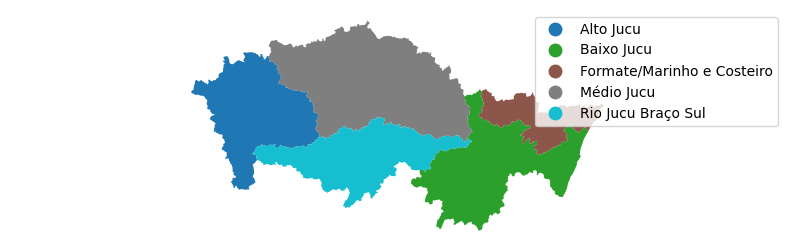

In [ ]:
area_path = path_inp + "/subbacias.gpkg"
area = gpd.read_file(area_path, driver='GPKG')

# create the plot
fig, ax = plt.subplots(figsize = (10,3))

# plot the data
area.reset_index().plot(column = 'subbacia', ax=ax, legend = 'subbacia')
#area.reset_index().plot(column = 'bacia', ax=ax, legend = 'bacia')

# Set plot axis to equal ratio
ax.set_axis_off()
plt.axis('equal');

area.crs

     RH        AREA                                           geometry
0  JUCU  2174.03431  POLYGON ((305433.694 7734172.556, 305435.503 7...


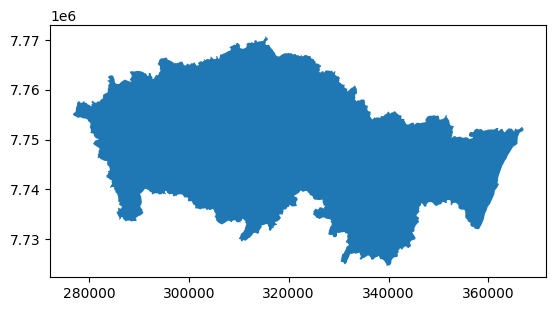

In [ ]:
# Dissolvendo mapa para correspnder à região estudada
area = area.dissolve()
area['AREA'] = area.geometry.area / 1000000
area['RH'] = "JUCU"
area = area[['RH','AREA','geometry']]
area.plot()
print(area)

# Importando tabelas do ISH

In [ ]:
#Importando tabela

## Caminho para arquivos
### DIMENSÂO HUMANA (hum)
hum_2035_path = path_inp + '/originais/2035/ISH_Humano_2035_vF.xlsx'
### DIMENSÃO ECONÔMICA (eco)
eco_2035_path = path_inp + '/originais/2035/ISH_Economico_2035_vF.xlsx'
### DIMENSÃO ECOSSISTÊMICA (amb)
amb_2035_path = path_inp + '/originais/2035/ISH_Ecossistemico_2035_vF.xlsx'
### DIMENSÃO RESILIÊNCIA (res)
res_2035_path = path_inp + '/originais/2035/ISH_Resiliencia_2035_vF.xlsx'


## Dimensão humana 2035


In [ ]:
# Importando e visualizando tabela da dimensão HUMANA
hum_2035 = pd.read_excel(hum_2035_path)
hum_2035.head().T

#Visualizando tipos de dados
#hum_2035.dtypes

# DICIONÁRIO DE COLUNAS ---- DIMENSÃO HUMANA -----------------
# CAMPO,DESCRIÇÃO
# ihu_mun_cd, Código do município.
# ihu_mun_nm, Nome do município.
# ihu_uf, Unidade da Federação.
# dmu_nu_poptotal, Valor da população total do município.
# dmu_nu_popurbana, Valor da população urbana do município.
# dmu_nu_poprural, Valor da população rural do município.
# ihu_nu_popriscoinerente, Valor de população (nº habitantes) em risco inerente.
# ihu_nu_popriscoposdeficit, Valor de população (nº habitantes) em risco pós-déficit.
# ihu_nu_popriscototal, Valor de população (nº habitantes) em risco total.
# ihu_pc_risco, Percentual de população em risco no município para o respectivo cenário.
# ihu_pc_cobrede, Percentual de cobertura de rede do município.
# ihu_cs_ish, Classe (1-5) do Índice de Segurança Hídrica do município associado à sua população urbana.

,0,1,2,3,4
ihu_mun_cd,1100015,1100023,1100031,1100049,1100056
ihu_mun_nm,Alta Floresta D'Oeste,Ariquemes,Cabixi,Cacoal,Cerejeiras
ihu_uf,RO,RO,RO,RO,RO
dmu_nu_poptotal,26186,110120,6414,90606,18345
dmu_nu_popurbana,18233,100143,3651,77027,16269
dmu_nu_poprural,7953,9977,2764,13578,2076
ihu_nu_popriscoinerente,360,80,180,0,0
ihu_nu_popriscoposdeficit,0,0,0,0,0
ihu_nu_popriscototal,360,80,180,0,0
ihu_pc_risco,0.019759,0.000795,0.049243,0.000002,0.000003


In [ ]:
#Analisando os dados da dimensão humana
## Porcentagem da população em risco
hum_2035.groupby(['ihu_uf'])['ihu_pc_cobrede'].agg(['max','min','mean','median'])

## Porcentagem da cobertura de rede
hum_2035.groupby(['ihu_uf'])['ihu_pc_cobrede'].agg(['max','min','mean','median'])

## ISH hum dos municípios
hum_2035.groupby(['ihu_uf'])['ihu_cs_ish'].agg(['max','min','mean','median'])

## Soma da população
hum_2035.groupby(['ihu_uf'])['dmu_nu_poptotal'].agg(['sum'])

,sum
ihu_uf,
AC,1043343
AL,3514777
AM,5132248
AP,1092070
BA,15846322
CE,9584227
DF,4233097
ES,4771636
GO,8264924


In [ ]:
#Filtrando dados para a área de estudo
hum_area_2035 = hum_2035[(hum_2035['ihu_mun_nm'].isin(mun)) & (hum_2035['ihu_uf'] == uf)]
hum_area_2035.head(6).T
#print(hum_area_2035)

,2853,2859,2865,2882,2910,2913
ihu_mun_cd,3201308,3201902,3202405,3203346,3205101,3205200
ihu_mun_nm,Cariacica,Domingos Martins,Guarapari,Marechal Floriano,Viana,Vila Velha
ihu_uf,ES,ES,ES,ES,ES,ES
dmu_nu_poptotal,471701,42599,150453,20288,93274,592299
dmu_nu_popurbana,460767,20095,147382,13893,87149,589979
dmu_nu_poprural,10935,22504,3071,6396,6125,2320
ihu_nu_popriscoinerente,55796,12,10362,8,8116,63966
ihu_nu_popriscoposdeficit,248636,0,1365,0,49341,391033
ihu_nu_popriscototal,304432,12,11727,8,57457,454999
ihu_pc_risco,0.660706,0.000596,0.079567,0.000596,0.659302,0.771212


## Dimensão econômica 2035


In [ ]:
# importando e visualizando tabela da dimensão ECONÔMICA
eco_2035 = pd.read_excel(eco_2035_path)
eco_2035.head().T

#Visualizando tipos de dados
#eco_2035.dtypes

# DICIONÁRIO DE COLUNAS ---- DIMENSÃO ECONÔMICA -----------------
# CAMPO,DESCRIÇÃO
# ihe_mun_cd, Código do município.
# ihe_mun_nm, Nome do município.
# ihe_uf, Unidade da Federação.
# pai_nu_total, Valor total da produção irrigada (mil R$; convertido para milhões R$).
# ihe_vl_irriginerente," Valor econômico em risco inerente associado à irrigação, em milhões de reais.."
# ihe_vl_irrigposdeficit," Valor econômico em risco pós déficit associado à irrigação, em milhões de reais."
# ihe_vl_irrigtotal," Valor econômico em risco (total) associado à irrigação, em milhões de reais."
# ppe_vl_rebanhos, Valor da produção pecuária (mil R$; convertido para milhões R$).
# ihe_vl_animinerente," Valor econômico em risco inerente associado à pecuária, em milhões de reais."
# ihe_vl_animposdeficit," Valor econômico em risco pós déficit associado à pecuária, em milhões de reais."
# ihe_vl_animtotal," Valor econômico em risco (total) associado à pecuária, em milhões de reais."
# vab_vl_industrianumeric, Valor adicionado bruto a preços correntes da Indústria (mil Reais; convertido para milhões R$).
# ihe_vl_indinerente," Valor econômico em risco inerente associado à indústria, em milhões de reais."
# ihe_vl_indposdeficit," Valor econômico em risco pós déficit associado à indústria, em milhões de reais."
# ihe_vl_indtotal," Valor econômico em risco (total) associado à indústria, em milhões de reais."
# ihe_pc_riscoirrig, Percentual de valor econômico em risco associado à irrigação.
# ihe_pc_riscoanim, Percentual de valor econômico em risco associado à pecuária.
# ihe_pc_riscoind, Percentual de valor econômico em risco associado à indústria.
# ihe_cs_ishirrig, Classe (1-5) do Índice de Segurança Hídrica do município associado à irrigação.
# ihe_cs_ishanim, Classe (1-5) do Índice de Segurança Hídrica do município associado à pecuária.
# ihe_cs_ishind, Classe (1-5) do Índice de Segurança Hídrica do município associado à indústria.


,0,1,2,3,4
ihe_mun_cd,1100015,1100023,1100031,1100049,1100056
ihe_mun_nm,Alta Floresta D'Oeste,Ariquemes,Cabixi,Cacoal,Cerejeiras
ihe_uf,RO,RO,RO,RO,RO
pai_nu_total,5.662753,1.924832,0.075374,46.105061,0.901159
ihe_vl_irriginerente,0.008856,0.000013,0.000011,0.444228,0.000694
ihe_vl_irrigposdeficit,0.0,0.0,0.0,0.0,0.0
ihe_vl_irrigtotal,0.008856,0.000013,0.000011,0.444228,0.000694
ppe_vl_rebanhos,1078.201519,1176.647416,316.680598,1141.886848,235.033926
ihe_vl_animinerente,2.288355,0.289099,0.045407,8.396562,1.269505
ihe_vl_animposdeficit,0.0,0.0,0.0,0.0,0.0


In [ ]:
#Analisando os dados da dimensão humana
## Porcentagem do valor da agricultura irrigada em risco
eco_2035.groupby(['ihe_uf'])['ihe_pc_riscoirrig'].agg(['max','min','mean','median'])

## Porcentagem do valor da pecuária em risco
eco_2035.groupby(['ihe_uf'])['ihe_pc_riscoanim'].agg(['max','min','mean','median'])

## Porcentagem do valor da indústria em risco
eco_2035.groupby(['ihe_uf'])['ihe_pc_riscoind'].agg(['max','min','mean','median'])


,max,min,mean,median
ihe_uf,,,,
AC,0.415141,2.780946e-10,0.045371,4.069551e-04
AL,0.995456,3.466924e-06,0.425091,4.544625e-01
AM,0.032435,0.000000e+00,0.000574,2.241528e-08
AP,0.049462,3.879915e-09,0.004414,1.145222e-04
BA,1.000000,2.641229e-10,0.233548,6.511656e-02
CE,1.000000,3.273116e-05,0.830408,9.584625e-01
DF,0.027418,2.741764e-02,0.027418,2.741764e-02
ES,0.530070,5.386599e-05,0.074240,9.096696e-03
GO,0.835617,4.175582e-10,0.059664,8.398557e-03


In [ ]:
#Filtrando dados para a área de estudo
eco_area_2035 = eco_2035[(eco_2035['ihe_mun_nm'].isin(mun)) & (eco_2035['ihe_uf'] == uf)]
eco_area_2035.head(6).T
#print(hum_area_2035)

,3113,3119,3125,3142,3170,3173
ihe_mun_cd,3201308,3201902,3202405,3203346,3205101,3205200
ihe_mun_nm,Cariacica,Domingos Martins,Guarapari,Marechal Floriano,Viana,Vila Velha
ihe_uf,ES,ES,ES,ES,ES,ES
pai_nu_total,4.177516,154.78641,6.23306,10.704753,11.208813,13.044796
ihe_vl_irriginerente,0.248653,9.362317,0.02972,0.052205,0.269705,0.407004
ihe_vl_irrigposdeficit,0.0,0.865365,0.0,0.0,1.474531,2.350814
ihe_vl_irrigtotal,0.248653,10.227682,0.02972,0.052205,1.744236,2.757818
ppe_vl_rebanhos,24.545877,98.761632,61.879416,59.448126,53.148204,24.36876
ihe_vl_animinerente,0.620877,1.096928,0.495758,0.02938,0.791225,0.931899
ihe_vl_animposdeficit,0.0,0.218956,0.0,0.0,4.403084,5.583115


## Dimensão ecossistêmica 2035


In [ ]:
# importando e visualizando tabela da dimensão AMBIENTAL
amb_2035 = pd.read_excel(amb_2035_path)
amb_2035.head().T

#Visualizando tipos de dados
#amb_2035.dtypes

# DICIONÁRIO DE COLUNAS ---- DIMENSÃO ECOSSISTÊMICA -----------------
# CAMPO,DESCRIÇÃO
# ivv_ach_cd,Código da ACH (área de contribuição hidrográfica) - Campo de JOIN com a BHO 2013
# ivv_qremanesc,Vazão Remanescente (razão de Q95%/usos consuntivos)
# ivv_qremanesc_classe,Vazão Remanescente -  Classe (1-5) do Índice de Segurança Hídrica
# dbo_nu_mgl,Concentração de DBO5,20 no trecho (mg/L)
# dbo_nu_classe,Concentração de DBO5,20 no trecho -  Classe (1-5) do Índice de Segurança Hídrica
# bre_cs_riscoish,Grau de segurança hídrica conforme riscos das barragens de rejeito.
# '''
#                     Dano Potencial (Impacto)
# Risco Estrutural    Baixo   Médio   Alto ou Sem informação
# Baixo               3       3         2
# Médio               3       2         1
# Alto ou Sem info    2       1         1
# '''


,0,1,2,3,4
ivv_ach_cd,7.593247e+07,7.591269e+07,7.714123e+06,7.591963e+06,825192.00000
ivv_qremanesc,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00000
ivv_qremanesc_classe,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.00000
dbo_nu_mgl,2.165750e+03,3.524466e+03,1.368603e+03,1.198213e+04,138.20446
dbo_nu_classe,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.00000
bre_cs_riscoish,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Convertendo coluna de int para string
amb_2035['ivv_ach_cd'] = amb_2035['ivv_ach_cd'].astype('string')


In [ ]:
#Filtrando dados para a área de estudo
amb_area_2035 = amb_2035[((amb_2035['ivv_ach_cd'] >= bho_min) & (amb_2035['ivv_ach_cd'] < bho_max)) | (amb_2035['ivv_ach_cd'].isin(bho_others))]
amb_area_2035.head().T
print(amb_area_2035)

       ivv_ach_cd  ivv_qremanesc  ivv_qremanesc_classe  dbo_nu_mgl  \
7592       791421   5.940000e-16                   1.0    1.000000   
20583       79148   5.042508e-01                   5.0    1.000000   
28159      791464   6.528094e-01                   5.0    1.000000   
32096     7914794   7.044352e-01                   5.0    1.000000   
46364     7914738   8.300093e-01                   5.0    1.000000   
...           ...            ...                   ...         ...   
280730    7914732   9.936437e-01                   5.0    1.000000   
291432    7914992   9.944342e-01                   5.0    1.000000   
296363    7914734   9.947877e-01                   5.0    1.000000   
324578     791469   9.969007e-01                   5.0    1.000000   
433548     791432   1.000000e+00                   5.0  230.640267   

        dbo_nu_classe  bre_cs_riscoish  
7592              5.0              NaN  
20583             5.0              NaN  
28159             5.0              N

In [ ]:
#Visualizando dados DBO
amb_area_2035.groupby(['dbo_nu_classe'])['dbo_nu_mgl'].agg(['max','min','mean','median'])

,max,min,mean,median
dbo_nu_classe,,,,
1.0,230.640267,38.117882,147.559177,160.739280
2.0,10.207875,10.207875,10.207875,10.207875
3.0,8.521782,8.521782,8.521782,8.521782
5.0,1.289246,1.000000,1.004254,1.000000


In [ ]:
#Visualiando dados Q90 (vazão remanescente)
amb_area_2035.groupby(['ivv_qremanesc_classe'])['ivv_qremanesc'].agg(['max','min','mean','median'])


,max,min,mean,median
ivv_qremanesc_classe,,,,
1.0,5.940000e-16,5.940000e-16,5.940000e-16,5.940000e-16
5.0,1.000000e+00,5.042508e-01,9.466763e-01,9.777118e-01


## Dimensão resiliência à seca 2035

In [ ]:
# importando e visualizando tabela da dimensão RESILIÊNCIA
res_2035 = pd.read_excel(res_2035_path)
res_2035.head().T

#Visualizando tipos de dados
#res_2035.dtypes

# DICIONÁRIO DE COLUNAS ---- DIMENSÃO RESILIÊNCIA -----------------
# # CAMPO,DESCRIÇÃO
# ivv_ach_cd,Código da ACH (área de contribuição hidrográfica) - Campo de JOIN com a BHO 2013
#  S1_ivv_nu,Resiliência à Seca - Reservação Artificial - Volume Potencial por Ottobacia (hm³/km²)
# S1_ivv_classe,Resiliência à Seca - Reservação Artificial -  Classe (1-5) do Índice de Segurança Hídrica
# S2_ivv_nu,Resiliência à Seca - Reservação Natural – Adimensional (Razão Q95 / QMLT)
# S2_ivv_classe,Resiliência à Seca - Reservação Natural –  Classe (1-5) do Índice de Segurança Hídrica
# S3_ivv_classe,Resiliência à Seca - Potencial de Armazenamento Subterrâneo – Classes:
#                                    Classe,Descrição (CI = coeficiente de infiltração)
#                                    5,CI ≥ 15% OU Aquíferos Porosos e Cársticos sem CI
#                                    4,10% < CI < 15%
#                                    3,5% < CI < 10%
#                                    2,1% < CI < 5%
#                                    1,CI < 1% e unidades pouco produtivas
# S4_ivv_nu,Resiliência à Seca - Variabilidade Pluviométrica - Adimensional (CV da chuva anual)
# S4_ivv_classe,Resiliência à Seca - Variabilidade Pluviométrica -  Classe (1-5) do Índice de Segurança Hídrica
#


,0,1,2,3,4
ivv_ach_cd,4.976243e+09,4.976243e+09,4.976243e+09,4.976243e+09,4.976243e+09
S1_ivv_nu,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
S1_ivv_classe,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
S2_ivv_nu,3.819037e-01,3.819036e-01,3.819036e-01,3.819037e-01,3.819037e-01
S2_ivv_classe,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00
S3_ivv_classe,4.000000e+00,4.000000e+00,4.000000e+00,4.000000e+00,4.000000e+00
S4_ivv_nu,2.000000e-01,2.000000e-01,2.000000e-01,1.990000e-01,2.000000e-01
S4_ivv_classe,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00


In [ ]:
#Convertendo coluna de int para string
res_2035['ivv_ach_cd'] = res_2035['ivv_ach_cd'].astype('string')


In [ ]:
#Filtrando dados para a área de estudo
res_area_2035 = res_2035[((res_2035['ivv_ach_cd'] >= bho_min) & (res_2035['ivv_ach_cd'] < bho_max)) | (res_2035['ivv_ach_cd'].isin(bho_others))]
res_area_2035.head().T
print(res_area_2035)

       ivv_ach_cd     S1_ivv_nu   S1_ivv_classe  S2_ivv_nu  S2_ivv_classe  \
526560      79141  1.224273e-08               1   0.413725            5.0   
526561     791421  3.717136e-08               1   0.413725            5.0   
526562     791422  4.963254e-08               1   0.413726            5.0   
526563     791423  4.126389e-08               1   0.413725            5.0   
526564     791424  2.142573e-08               1   0.413725            5.0   
...           ...           ...             ...        ...            ...   
526630     791497  3.054874e-08               1   0.413726            5.0   
526631     791498  7.172495e-08               1   0.413725            5.0   
526632    7914991  3.572525e-08               1   0.413726            5.0   
526633    7914992  1.433580e-08               1   0.413725            5.0   
526634    7914993  1.177399e-08               1   0.413725            5.0   

        S3_ivv_classe  S4_ivv_nu  S4_ivv_classe  
526560            4.0    

In [ ]:
#Visualizando dados Resiliência à Seca - Reservação Artificial
res_area_2035.groupby(['S2_ivv_classe'])['S2_ivv_nu'].agg(['max','min','mean','median'])

,max,min,mean,median
S2_ivv_classe,,,,
5.0,0.413727,0.413724,0.413725,0.413725


# Alocando setores cencitários

In [ ]:
#Obtendo os setores cencitários do censo de 2010 para o estado do Espírito Santo
censo_uf_2010=geobr.read_census_tract(code_tract=uf, year=2010)

#Obtendo o nome de todos os municípios do nosso geodataframe
munis=pd.unique(censo_uf_2010.name_muni)


#Selecionando apenas os cetores cencitários dos municípios de interesse e armazenando em uma variável

# Filtrando municípios do Jucu
censo_mun_2010 = censo_uf_2010[censo_uf_2010['name_muni'].isin(mun)]


In [ ]:
censo_mun_2010.head().T

,562,563,564,565,566
code_tract,320130805000071,320130805000072,320130805000073,320130805000074,320130805000075
zone,URBANO,URBANO,URBANO,URBANO,URBANO
code_muni,3201308.0,3201308.0,3201308.0,3201308.0,3201308.0
name_muni,Cariacica,Cariacica,Cariacica,Cariacica,Cariacica
name_neighborhood,Nova Brasília,Nova Brasília,Nova Brasília,Prolar,Santa Luzia
code_neighborhood,320130805047.0,320130805047.0,320130805047.0,320130805040.0,320130805043.0
code_subdistrict,32013080500.0,32013080500.0,32013080500.0,32013080500.0,32013080500.0
name_subdistrict,None,None,None,None,None
code_district,320130805.0,320130805.0,320130805.0,320130805.0,320130805.0
name_district,Cariacica,Cariacica,Cariacica,Cariacica,Cariacica


In [ ]:
#Criando um mapa navegavel com o folium

censo_mun_2010.explore( column="zone", cmap="RdYlGn", legend=False, categorical=True)

In [ ]:
# Ler dataframe com população do censo
# data_url = "https://raw.githubusercontent.com/ipeaGIT/geobr/master/r-package/inst/extdata/br_states_lifexpect2017.csv"

# df = pd.read_csv(data_url, index_col=0)

# states["name_state"] = states["name_state"].str.lower()
# df["uf"] = df["uf"].str.lower()

# # join the databases
# states = states.merge(df, how="left", left_on="name_state", right_on="uf")

In [ ]:
# Unir tabelas de dados
# Renomear a coluna 'Idade' para 'Anos'

#hum_area_2035 = hum_area_2035.rename(columns={'ihe_mun_nm':'name_muni'})
#censo_mun_2010 = censo_mun_2010.merge(hum_2035, on='name_muni')

#Adicionando Mapa ISH inicial (2017)

<Axes: >

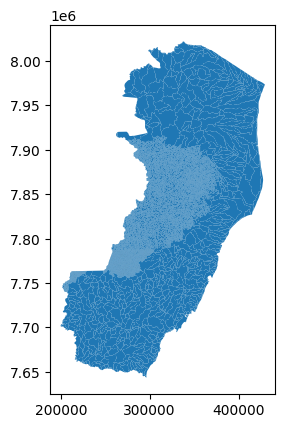

In [ ]:
# Lendo um arquivo GeoPackage
ish_2017_path = path_inp + "/originais/2017/ISH_2017_ES.gpkg"
ish_2017 = gpd.read_file(ish_2017_path)
ish_2017.plot()

In [ ]:
#Visualizando tipos de dados

## Convertendo 'cobacia' para int
#ish_2017['cobacia'] = ish_2017['cobacia'].astype(int)

## Novo formato de dados (visualizando)
ish_2017.dtypes

cobacia         object
ecossistem      object
humana          object
economica       object
resilienc       object
brasil          object
Shape_Leng     float64
Shape_Area     float64
fid_2            int64
id               int64
produto         object
versão           int64
uf              object
src             object
download        object
metadados       object
geometry      geometry
dtype: object

In [ ]:
#Visualiando tabela
ish_2017.head().T

,0,1,2,3,4
cobacia,7796164,7796165,7796166,7796168,7796169
ecossistem,Máximo,Máximo,Máximo,Máximo,Máximo
humana,None,None,None,None,Alto
economica,Máximo,Alto,Máximo,Máximo,Médio
resilienc,Médio,Baixo,Baixo,Baixo,Baixo
brasil,Alto,Alto,Alto,Alto,Alto
Shape_Leng,0.188631,0.588832,0.367707,0.375873,0.344103
Shape_Area,0.001867,0.009968,0.005111,0.004899,0.006055
fid_2,6,6,6,6,6
id,6,6,6,6,6


In [ ]:
# ish_jucu_2017 = ish_2017[(ish_2017['cobacia'] >= '7914000') & (ish_2017['cobacia'] < '7915000')]
# print(ish_jucu_2017)

In [ ]:
# Recortando dados para a Região Hidrográfica de interesse
ish_2017_reproj = ish_2017.to_crs(area.crs)
ish_2017_RH = ish_2017_reproj.clip(area)
ish_2017_RH.head().T

#Criando lista com código das ottobacias
otto_ish2017 = ish_2017_RH[['cobacia','brasil','geometry']]
otto_ish2017.rename(columns={'brasil': 'cs_bra_2017'}, inplace = True)
print(otto_ish2017)
otto_ish2017.crs

          cobacia cs_bra_2017  \
16275   781894996        Alto   
19157     7916499        Alto   
16269   781894985        Alto   
16240  7818949292        Alto   
16241  7818949293        Alto   
...           ...         ...   
18944      791431       Médio   
18945      791432       Médio   
18876      791211       Médio   
19011      791511      Mínimo   
18935        7913      Mínimo   

                                                geometry  
16275  POLYGON ((277442.522 7756428.578, 277418.636 7...  
19157  MULTIPOLYGON (((277835.727 7754399.127, 277955...  
16269  POLYGON ((277442.522 7756428.578, 277437.319 7...  
16240  POLYGON ((277768.553 7757513.745, 277707.671 7...  
16241  POLYGON ((277809.317 7757536.278, 277768.553 7...  
...                                                  ...  
18944  POLYGON ((362508.159 7747460.178, 362404.083 7...  
18945  POLYGON ((358869.448 7750573.235, 358922.457 7...  
18876  MULTIPOLYGON (((365370.823 7752166.778, 365484...  
19011  POLYGO

<Projected CRS: EPSG:31984>
Name: SIRGAS 2000 / UTM zone 24S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - between 42°W and 36°W, northern and southern hemispheres, onshore and offshore.
- bounds: (-42.0, -26.35, -36.0, 0.74)
Coordinate Operation:
- name: UTM zone 24S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<Axes: >

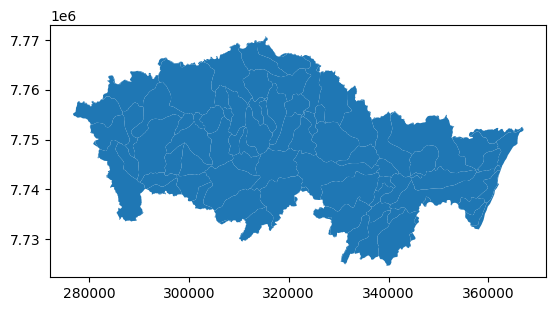

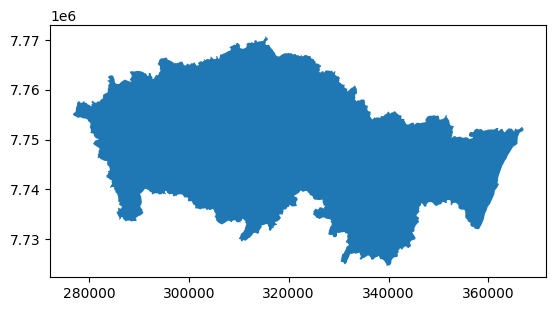

In [ ]:
otto_ish2017.plot()
area.plot()

In [ ]:
# #Criando um mapa interativo com o Leafmap
# m = leafmap.Map(center=(-20, -40),
#                 zoom=4,
#                 height="400px", width="800px")
# #m.add_gdf(ish_jucu_2017, layer_name='Jucu' , zoom_to_layer=True)
# #m.add_gdf(censo_mun_2010, layer_name='Censo')
# #m.add_gdf(ish_2017_RH, layer_name='RHJ', zoom_to_layer=True)
# m.add_gdf(ups_ish2017, layer_name='ISH 2017', zoom_to_layer=True)
# m


In [ ]:
# #Criando um mapa interativo com o Folium
# ish_jucu_2017.explore(height=400, width=800)

In [ ]:
# Salvando arquivo filtrado
otto_ish2017.to_file(path_out +"/ish_jucu_2017.gpkg", driver="GPKG", overwrite=True)

# Adicionando Mapa ISH 2035

In [ ]:
# #url = "https://www.snirh.gov.br/arcgis/rest/services/SPR/ISH_Dimens%C3%A3o_Ecossistemica/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson"
# url = "https://www.snirh.gov.br/arcgis/rest/services/SPR/ISH/FeatureServer/0?f=pjson"
# response = requests.get(url)
# data = response.json()
# gdf = gpd.GeoDataFrame.from_features(data["features"])


In [ ]:
# print(type(gdf))
# print(gdf.head())

In [ ]:
# #Se quiser usar pastas no Google Drive
# from google.colab import drive
# drive.mount("/content/drive")

<Axes: >

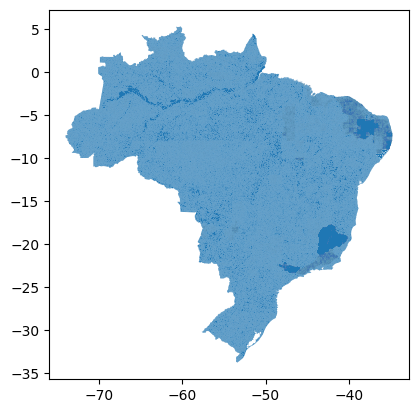

In [ ]:
# Lendo um arquivo GeoPackage
ish_2035_path = path_inp + "/ish_brasil_2035_orig.gpkg"
ish_2035 = gpd.read_file(ish_2035_path)
ish_2035.plot()

In [ ]:
# # Carregar a pasta com o ISH
# ish=gpd.read_file(path_inp + "/ISH_brasil_2035/ISH-Brasil-2035.shp")
# print(ish)
# ish.plot()

        cobacia ish_bra_gr gr_ish_amb     gr_ish_hum gr_ish_eco gr_ish_res  \
470993   791469       Alto     Máximo         Máximo     Máximo      Médio   
470992   791468       Alto     Máximo  Não se aplica     Máximo      Médio   
471035  7914992     Máximo     Máximo         Máximo     Máximo       Alto   
471029   791494       Alto     Máximo  Não se aplica     Máximo      Médio   
471079  7915674       Alto     Máximo           Alto     Máximo      Médio   
...         ...        ...        ...            ...        ...        ...   
470976  7914522      Baixo      Médio         Mínimo      Médio      Médio   
470973    79144      Médio     Máximo         Mínimo      Médio      Médio   
470903   791212      Baixo      Médio         Mínimo      Médio      Médio   
470909   791223      Médio      Médio         Mínimo      Médio       Alto   
470902   791211      Baixo      Baixo         Mínimo      Médio      Médio   

                                                 geometry  
470

<Axes: >

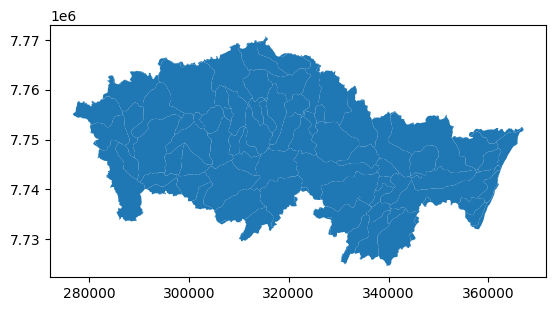

In [ ]:
# Recortando dados para a Região Hidrográfica de interesse
ish_2035_reproj = ish_2035.to_crs(area.crs)
ish_2035_RH = ish_2035_reproj.clip(area)
# ish_2035_RH.head().T

#Criando lista com código das ottobacias
otto_ish2035 = ish_2035_RH[['ace_cd','ish_bra_gr','gr_ish_amb','gr_ish_hum','gr_ish_eco','gr_ish_res','geometry']]
otto_ish2035.rename(columns={'ace_cd': 'cobacia'}, inplace = True)
print(otto_ish2035)
otto_ish2035.plot()

In [ ]:
# Salvando arquivo filtrado
otto_ish2035.to_file(path_out +"/ish_jucu_2035.gpkg", driver="GPKG", overwrite=True)

<Axes: >

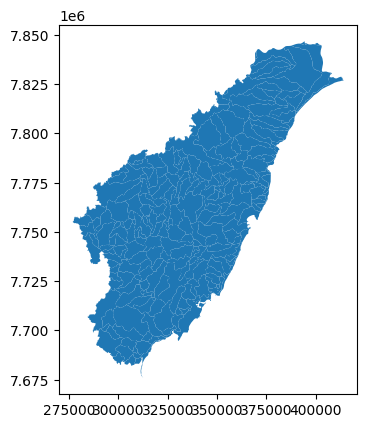

In [ ]:
# Carregar a pasta com o ISH ajustado

inunda_2035_path = path_inp + "/ishadj_V3.gpkg"
inunda_2035 = gpd.read_file(inunda_2035_path)
inunda_2035.plot()

<Axes: >

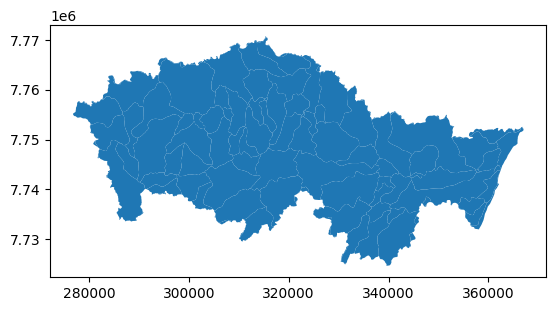

In [ ]:
# Recortando dados para a Região Hidrográfica de interesse
ishadj_2035_reproj = inunda_2035.to_crs(area.crs)
ishadj_2035_RH = ishadj_2035_reproj.clip(area)
print(ishadj_2035_RH)

#Criando lista com código das ottobacias
otto_ishadj2035 = ishadj_2035_RH
otto_ishadj2035.rename(columns={'ace_cd': 'cobacia'}, inplace = True)
print(otto_ishadj2035)
otto_ishadj2035.plot()

In [ ]:
print(ishadj_2035_RH)

      cobacia  ire_cs_ish ish_bra_gr ish_cs_nov  gr_ish_inu ish_cs_inu  \
495   7916467    4.331923       Alto       Alto         NaN       None   
494   7916466    4.247319       Alto       Alto         NaN       None   
411   7914993    4.101168       Alto       Alto         NaN       None   
410   7914992    4.666667     Máximo     Máximo         NaN       None   
496   7916499    3.947524       Alto       Alto         NaN       None   
..        ...         ...        ...        ...         ...        ...   
278    791212    2.500000      Baixo      Baixo         1.0     Mínimo   
348     79144    3.083333      Médio      Médio         1.0     Mínimo   
284    791223    2.792702      Médio      Baixo         1.0     Mínimo   
195  78188994    3.666667       Alto       Alto         NaN       None   
189  78188979    3.666667       Alto       Alto         NaN       None   

     gr_vul_in  mean_ish                                           geometry  
495        NaN     4.332  MULTIPO

In [ ]:
# Salvando arquivo filtrado
otto_ishadj2035.to_file(path_out +"/ishadj_jucu_2035.gpkg", driver="GPKG", overwrite=True)

In [ ]:
# ishadj = gpd.GeoDataFrame(otto_ish2017, geometry = otto_ish2017['geometry'])
ishadj = otto_ish2017.copy()
ishadj = ishadj.merge(otto_ish2035[['cobacia','ish_bra_gr','gr_ish_amb','gr_ish_hum', 'gr_ish_eco','gr_ish_res']], on='cobacia')
ishadj = ishadj.merge(otto_ishadj2035[['cobacia','ish_cs_nov','gr_ish_inu','ish_cs_inu','mean_ish']], on='cobacia')
print(ishadj)
ishadj.plot()
ishadj.crs
ishadj.dtypes
ishadj.explore()

In [ ]:
ishadj_out = path_out + "/ishadj"
ishadj.to_file(ishadj_out + '.gpkg', driver='GPKG')
ishadj.to_file(ishadj_out + '.geojson', driver='GeoJSON')
# ishadj.to_excel(ishadj_out + '.xlsx', index = False)

In [ ]:
import matplotlib.pyplot as plt
import folium
import geopandas as gpd

In [ ]:
# Criar um dicionário que mapeie cada valor para uma cor
cores = {"Máximo": "blue", "Alto": "green", "Médio": "yellow", "Baixo": "orange", "Mínimo": "red", "Não se aplica": "white", None: "white"}

# Criar um geodataframe com o contorno externo do censo_mun_2010
# contorno = censo_mun_2010.dissolve()

# Criar um mapa interativo usando folium
m = folium.Map(location=[-20.313527,-40.290877], zoom_start=8)

In [ ]:
# Definir uma função de estilo para cada camada

def style_contorno(feature):
    return {"fillColor": "green", "fillOpacity": 0.3, "weight": 1}

def style_ish_bra(feature):
    return {"fillColor": cores[feature["properties"]["ish_bra_gr"]], "fillOpacity": 0.5, "weight": 1}

def style_ish_eco(feature):
    return {"fillColor": cores[feature["properties"]["gr_ish_eco"]], "fillOpacity": 0.5, "weight": 1}

def style_ish_amb(feature):
    return {"fillColor": cores[feature["properties"]["gr_ish_amb"]], "fillOpacity": 0.5, "weight": 1}

def style_ish_hum(feature):
    return {"fillColor": cores[feature["properties"]["gr_ish_hum"]], "fillOpacity": 0.5, "weight": 1}

def style_ish_res(feature):
    return {"fillColor": cores[feature["properties"]["gr_ish_res"]], "fillOpacity": 0.5, "weight": 1}

def style_ish_inu(feature):
    return {"fillColor": cores[feature["properties"]["ish_cs_inu"]], "fillOpacity": 0.5, "weight": 1}

def style_ish_novo(feature):
    return {"fillColor": cores[feature["properties"]["ish_cs_nov"]], "fillOpacity": 0.5, "weight": 1}

# Adicionar a camada do contorno ao mapa
# rmgv_contorno=folium.GeoJson(contorno, style_function=style_contorno, name="RMGV")

# Criar duas camadas de GeoJson para as dimensões do ish
ish_bra = folium.GeoJson(ishadj, style_function=style_ish_bra, name="ISH Brasil")
ish_eco = folium.GeoJson(ishadj, style_function=style_ish_eco, name="ISH Economia")
ish_amb = folium.GeoJson(ishadj, style_function=style_ish_amb, name="ISH Ecossistemica")
ish_hum = folium.GeoJson(ishadj, style_function=style_ish_hum, name="ISH Humana")
ish_res = folium.GeoJson(ishadj, style_function=style_ish_res, name="ISH Resiliência")
ish_inu = folium.GeoJson(ishadj, style_function=style_ish_inu, name="ISH Resiliência - Inundações")
ish_nov = folium.GeoJson(ishadj, style_function=style_ish_novo, name="ISH Brasil 2035 - c/ Inundações")

# Adicionar as duas camadas ao mapa
# rmgv_contorno.add_to(m)
ish_bra.add_to(m)
ish_eco.add_to(m)
ish_amb.add_to(m)
ish_hum.add_to(m)
ish_res.add_to(m)
ish_inu.add_to(m)
ish_nov.add_to(m)

# Criar um plugin de controle de camadas para alternar entre as duas camadas do ish
folium.LayerControl(position='topright', collapsed=True, autoZIndex=False).add_to(m)


In [ ]:
# Mostrar o mapa interativo
m

# Unir tabelas

In [ ]:
ish_2035_RH.head()

,ace_cd,ire_cs_amb,ire_cs_hum,ire_cs_eco,ire_cs_res,ire_cs_ish,ish_bra_gr,gr_ish_amb,gr_ish_hum,gr_ish_eco,gr_ish_res,geometry
495,7916467,5.0,0.000000,4.995770,3.000000,4.331923,Alto,Máximo,Não se aplica,Máximo,Médio,"MULTIPOLYGON (((-41.04253 -20.48073, -41.04254..."
494,7916466,5.0,3.800000,4.855943,3.333333,4.247319,Alto,Máximo,Alto,Máximo,Médio,"MULTIPOLYGON (((-41.05258 -20.45995, -41.05208..."
411,7914993,5.0,0.000000,3.636837,3.666667,4.101168,Alto,Máximo,Não se aplica,Alto,Alto,"POLYGON ((-41.00084 -20.42591, -41.00104 -20.4..."
410,7914992,5.0,5.000000,5.000000,3.666667,4.666667,Máximo,Máximo,Máximo,Máximo,Alto,"POLYGON ((-41.04115 -20.34619, -41.03871 -20.3..."
496,7916499,4.0,3.800494,4.989601,3.000000,3.947524,Alto,Alto,Alto,Máximo,Médio,"MULTIPOLYGON (((-41.08953 -20.36938, -41.08967..."


In [ ]:
ish_2035_RH['area'] = ish_2035_RH.area / 1e-6
ish_2035_RH.head().T

,495,494,411,410,496
ace_cd,7916467,7916466,7914993,7914992,7916499
ire_cs_amb,5.0,5.0,5.0,5.0,4.0
ire_cs_hum,0.0,3.8,0.0,5.0,3.800494
ire_cs_eco,4.99577,4.855943,3.636837,5.0,4.989601
ire_cs_res,3.0,3.333333,3.666667,3.666667,3.0
ire_cs_ish,4.331923,4.247319,4.101168,4.666667,3.947524
ish_bra_gr,Alto,Alto,Alto,Máximo,Alto
gr_ish_amb,Máximo,Máximo,Máximo,Máximo,Alto
gr_ish_hum,Não se aplica,Alto,Não se aplica,Máximo,Alto
gr_ish_eco,Máximo,Máximo,Alto,Máximo,Máximo


In [ ]:
# Unir tabelas de dados
# Renomear a coluna

res_2035 = res_2035.rename(columns={'ivv_ach_cd':'ace_cd'})
#censo_mun_2010 = censo_mun_2010.merge(hum_2035, on='name_muni')
amb_2035 = amb_2035.rename(columns={'ivv_ach_cd':'ace_cd'})

ish_2035_RH = ish_2035_RH.merge(res_2035, on='ace_cd')
ish_2035_RH = ish_2035_RH.merge(amb_2035, on='ace_cd')

print(ish_2035_RH)

        ace_cd  ire_cs_amb  ire_cs_hum  ire_cs_eco  ire_cs_res  ire_cs_ish  \
0      7916467         5.0    0.000000    4.995770    3.000000    4.331923   
1      7916466         5.0    3.800000    4.855943    3.333333    4.247319   
2      7914993         5.0    0.000000    3.636837    3.666667    4.101168   
3      7914992         5.0    5.000000    5.000000    3.666667    4.666667   
4      7916499         4.0    3.800494    4.989601    3.000000    3.947524   
..         ...         ...         ...         ...         ...         ...   
144     791212         3.0    1.000000    3.000000    3.000000    2.500000   
145      79144         5.0    1.000000    3.000000    3.333333    3.083333   
146     791223         3.5    1.000000    3.004141    3.666667    2.792702   
147  781889912         5.0    0.000000    0.000000    2.333333    3.666667   
148   78188979         5.0    0.000000    0.000000    2.333333    3.666667   

    ish_bra_gr gr_ish_amb     gr_ish_hum     gr_ish_eco  ... S2

In [ ]:
ish_2035_RH.head().T

,0,1,2,3,4
ace_cd,7916467,7916466,7914993,7914992,7916499
ire_cs_amb,5.0,5.0,5.0,5.0,4.0
ire_cs_hum,0.0,3.8,0.0,5.0,3.800494
ire_cs_eco,4.99577,4.855943,3.636837,5.0,4.989601
ire_cs_res,3.0,3.333333,3.666667,3.666667,3.0
ire_cs_ish,4.331923,4.247319,4.101168,4.666667,3.947524
ish_bra_gr,Alto,Alto,Alto,Máximo,Alto
gr_ish_amb,Máximo,Máximo,Máximo,Máximo,Alto
gr_ish_hum,Não se aplica,Alto,Não se aplica,Máximo,Alto
gr_ish_eco,Máximo,Máximo,Alto,Máximo,Máximo


In [ ]:
#Visualiando dados Q90 (vazão remanescente)
ish_2035_RH.groupby(['ivv_qremanesc_classe'])['ivv_qremanesc'].agg(['max','min','mean','median'])

,max,min,mean,median
ivv_qremanesc_classe,,,,
1.0,5.940000e-16,0.000000,2.970000e-16,2.970000e-16
3.0,2.187976e-01,0.154779,1.867884e-01,1.867884e-01
4.0,3.821748e-01,0.382175,3.821748e-01,3.821748e-01
5.0,1.000000e+00,0.504251,9.537332e-01,9.767559e-01


In [ ]:
#Visualizando dados DBO
ish_2035_RH.groupby(['dbo_nu_classe'])['dbo_nu_mgl'].agg(['max','min','mean','median'])

,max,min,mean,median
dbo_nu_classe,,,,
1.0,432.900495,35.555866,185.971769,128.037624
2.0,13.900484,10.207875,12.152588,12.349405
3.0,9.447450,7.699903,8.699408,8.825140
4.0,3.677076,3.477509,3.577293,3.577293
5.0,1.289246,1.000000,1.002278,1.000000


In [ ]:
#
ish_2035_RH.groupby([' S1_ivv_classe'])[' S1_ivv_nu'].agg(['max','min','mean','median'])

,max,min,mean,median
S1_ivv_classe,,,,
1,8.999143e-07,5.166790e-09,6.663534e-08,3.510586e-08
5,9.349206e-05,9.349206e-05,9.349206e-05,9.349206e-05


In [ ]:
#Criando um mapa interativo com o Leafmap
m = leafmap.Map(center=(-20, -40),
                zoom=4,
                height="400px", width="800px")
#m.add_gdf(ish_jucu_2017, layer_name='Jucu' , zoom_to_layer=True)
#m.add_gdf(censo_mun_2010, layer_name='Censo')
m.add_gdf(ish_2035_RH, layer_name='RHJ', zoom_to_layer=True)
m.add_data(ish_2035_RH, layer_name='RHJ',
       categories=[5,4,3,2,1],
       colors= cores_ish,
       column = "S4_ivv_classe",
       #cmap="RdYlGn_r",
       legend_position='bottomright',
       #style_kwds =dict(color="gray", LineWidth=10, weight=0.99)
        style = {
            "stroke": True,
            "color": "gray",
            "weight": .5,
            "opacity": .5,
            "fill": True,
            "fillOpacity": 0.5,
        }
      )
m

Map(center=[-20, -40], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

# Salvando Arquivos

In [ ]:
# Salvar o mapa interativo como um arquivo HTML
m.save(path_out + "/mapa.html")

# ish_jucu_2017.to_file(path_out + "ish_area_2017.gpkg", layer='ISH 2017', driver="GPKG")

AttributeError: 'NoneType' object has no attribute 'comm_id'

In [ ]:
# Usando o ExcelWriter, cria um doc .xlsx, usando engine='xlsxwriter'
writer = pd.ExcelWriter(path_out + '/tabela_ish.xlsx', engine='xlsxwriter')

# Armazena cada df em uma planilha diferente do mesmo arquivo
ish_2017_RH.to_excel(writer, sheet_name='ISH 2017')
ish_2035_RH.to_excel(writer, sheet_name='ISH 2035')
#df3.to_excel(writer, sheet_name='Tabela 3')

# Fecha o ExcelWriter e gera o arquivo .xlsx
writer.save()